Text(0.5, 1.0, 'histogram of gray values')

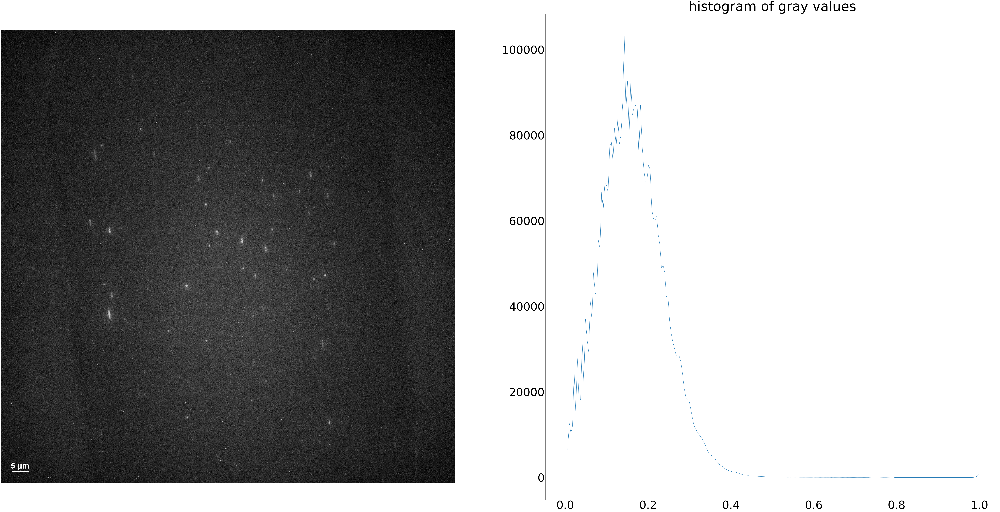

In [4]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

from skimage import data
from skimage.exposure import histogram
from skimage.color import rgb2gray
from skimage import morphology

image = Image.open('Examples/Device2_Area2_During30kcaseinandADAMTS13flow.jpg')
img_array = np.array(image)
image_gray = rgb2gray(img_array)
hist, hist_centers = histogram(image_gray)

plt.rcParams.update({'font.size': 100})
fig, axes = plt.subplots(1, 2, figsize=(160, 80))
axes[0].imshow(image_gray, cmap=plt.cm.gray)
axes[0].axis('off')
axes[1].plot(hist_centers, hist, lw=2)
axes[1].set_title('histogram of gray values')


In [47]:
from skimage.filters import sobel
from skimage.color import label2rgb
from scipy import ndimage
import collections

elevation_map = sobel(image_gray)

markers = np.zeros_like(image_gray)
markers[image_gray < .5] = 1                                   #set the threshold as 0.5 in grayscale
markers[image_gray > .5] = 2

segmentation = morphology.watershed(elevation_map, markers)
segmentation = ndimage.binary_fill_holes(segmentation - 1)
labeled_image_gray, _ = ndimage.label(segmentation)

a = collections.Counter(labeled_image_gray.reshape(-1))
b=collections.Counter(el for el in a.elements() if a[el] >=5)   #set the threshold as 5 pixels

sorted_val=[]
for key,val in b.items():
    sorted_val.append(key)
sorted_val=sorted_val[1:]                                       #get rid of sorted_val[0]=0
print(sorted_val)

[227, 270, 287, 370, 397, 404, 423, 477, 480, 502, 572, 621, 626, 639, 668, 693, 734, 747, 753, 776, 879, 928, 930, 931, 957, 998, 1006, 1039, 1069, 1088, 1195, 1235, 1262, 1326, 1394, 1434, 1563, 1608, 1682, 1741, 1754, 1899, 1905, 1906, 1926]


In [51]:
len(sorted_val)

45

442 631


IndexError: index 0 is out of bounds for axis 0 with size 0

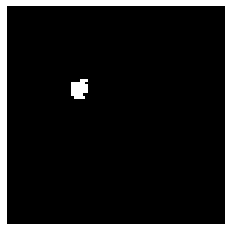

In [64]:
seg_map = np.copy(labeled_image_gray)
for i in range(0,len(sorted_val)-1):
    seg_map[labeled_image_gray != sorted_val[i]] = 0
    x,y=np.where(seg_map == sorted_val[i])
    print(x[0],y[0])
    cropped = seg_map[x[0]-25:x[0]+50,y[0]-25:y[0]+50]
    plt.axis('off')
    plt.imshow(cropped, cmap=plt.cm.gray)    

1990 74


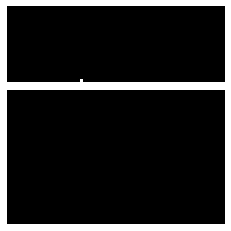

In [63]:
seg_map = np.copy(labeled_image_gray)
seg_map[labeled_image_gray != sorted_val[44]] = 0
x,y=np.where(seg_map == sorted_val[44])
print(x[0],y[0])
cropped = seg_map[x[0]-25:x[0]+50,y[0]-25:y[0]+50]
plt.axis('off')
plt.imshow(cropped, cmap=plt.cm.gray)    